TODO
 - Get a good transfer learning foundation to build off of
 - consider other ways to extract the texture/structure from the network

Image pre-processing strategy
 - convert to grayscale
 - create two channels, one for horizontal wavelet transform and another for the vertical version
 - feed into network


In [1]:
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Dropout, Flatten, GlobalAveragePooling2D
from keras.optimizers import SGD
from keras.callbacks import ReduceLROnPlateau
import numpy as np
import glob
import os
from scipy.misc import imread, imresize
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from skimage.color import rgb2gray
from keras.utils import np_utils
import pywt
import matplotlib.pyplot as plt
import cv2

Using TensorFlow backend.


#### Load Data

In [2]:
master_folder = '../../../Desktop/PhotosDataset'

imgs = []
labels = []
for photo in os.listdir(master_folder+'/Alex'):
    img = imread(master_folder+'/Alex/'+photo)
    imgs.append(img)
    labels.append('Alex')
for photo in os.listdir(master_folder+'/Hunter'):
    img = imread(master_folder+'/Hunter/'+photo)
    imgs.append(img)
    labels.append('Hunter')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:10: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  # Remove the CWD from sys.path while we load stuff.


#### Massage Data

In [3]:
# Take out alpha component of image
# convert to gray scale
# Resize image
imgs = [imresize(rgb2gray(img[:,:,[0,1,2]]),size=(300,400)) for img in imgs]

labels = [label == 'Hunter' for label in labels]

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
  after removing the cwd from sys.path.


#### Wavelet Transform on Hunter's images

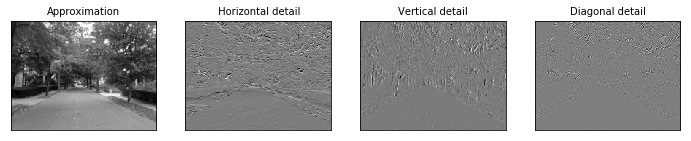

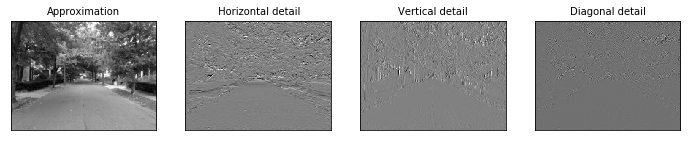

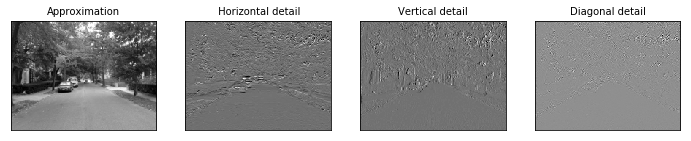

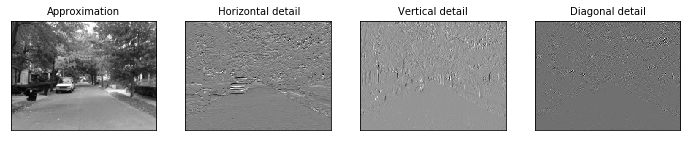

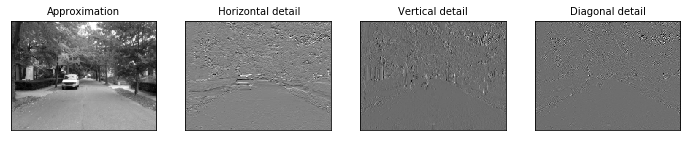

In [18]:
out_count = 0
for i, img in enumerate(imgs):
    if labels[i] == True and out_count < 5:
        out_count += 1
        coeffs2 = pywt.dwt2(imgs[i], 'haar')
        LL, (LH, HL, HH) = coeffs2
        # Wavelet transform of image, and plot approximation and details
        titles = ['Approximation', ' Horizontal detail',
                  'Vertical detail', 'Diagonal detail']
        fig = plt.figure(figsize=(12, 3))
        for i, a in enumerate([LL, LH, HL, HH]):
            ax = fig.add_subplot(1, 4, i + 1)
            ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
            ax.set_title(titles[i], fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])

#### Wavelet Transform on some of Alex's photos

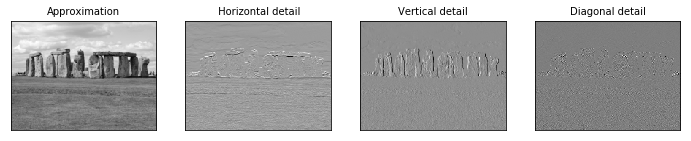

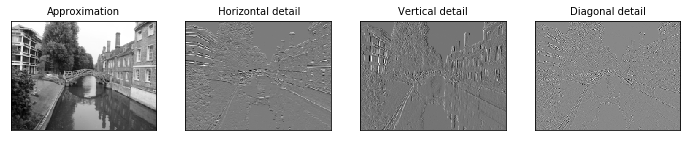

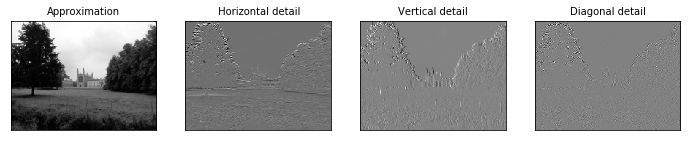

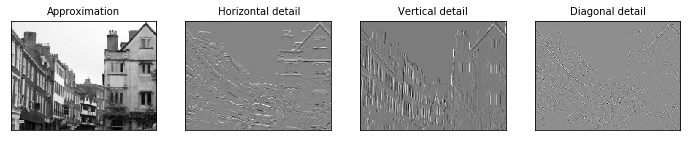

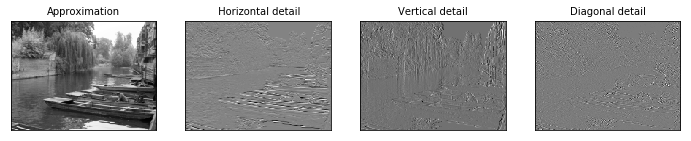

In [6]:
out_count = 0
for i, img in enumerate(imgs):
    if labels[i] == False and out_count < 5:
        out_count += 1
        coeffs2 = pywt.dwt2(imgs[i], 'haar')
        LL, (LH, HL, HH) = coeffs2
        # Wavelet transform of image, and plot approximation and details
        titles = ['Approximation', ' Horizontal detail',
                  'Vertical detail', 'Diagonal detail']
        fig = plt.figure(figsize=(12, 3))
        for i, a in enumerate([LL, LH, HL, HH]):
            ax = fig.add_subplot(1, 4, i + 1)
            ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
            ax.set_title(titles[i], fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])

Perform Canny Edge detection on Hunter's images

c:\users\gjber\appdata\local\programs\python\python36\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


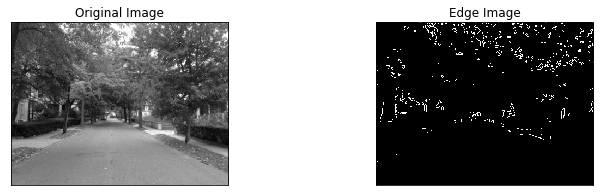

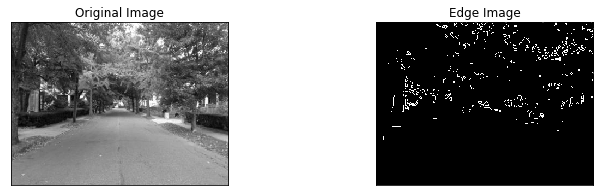

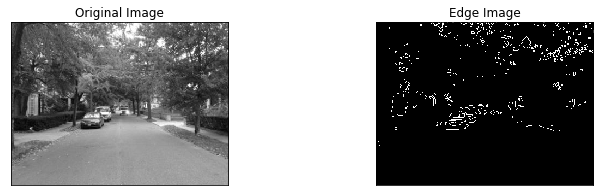

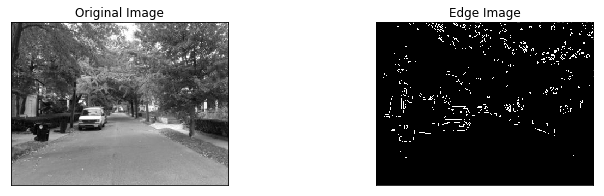

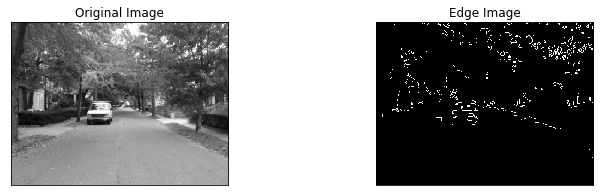

...

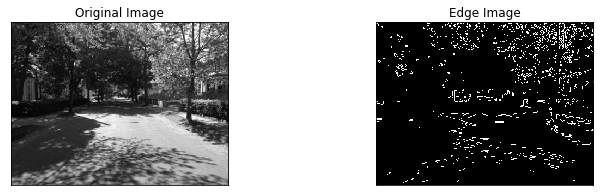

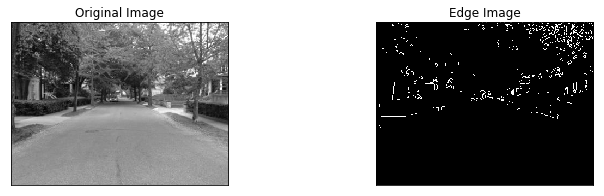

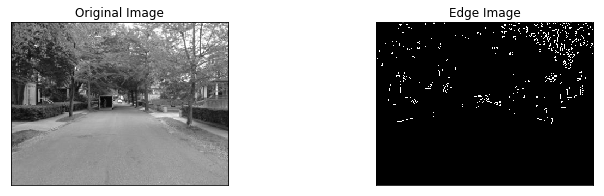

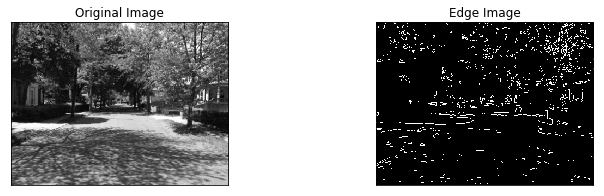

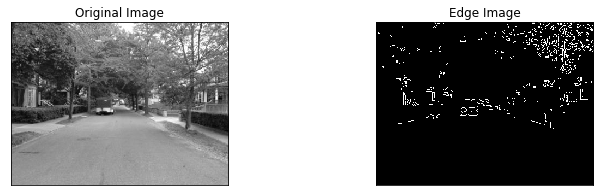

In [14]:
out_count = 0
for i, img in enumerate(imgs):
    if labels[i] == True:
        out_count += 1
        edges = cv2.Canny(img, 300,400)
        fig = plt.figure(figsize=(12, 3))

        plt.subplot(121),plt.imshow(img,cmap = 'gray')
        plt.title('Original Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(122),plt.imshow(edges,cmap = 'gray')
        plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

A key aspect of most of these images is that the majority of the edges are in the top half of the image

Apply Canny edge detection on Alex's images

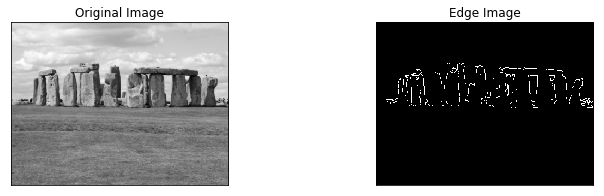

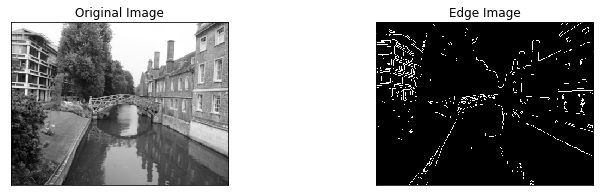

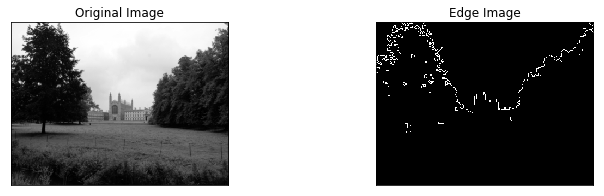

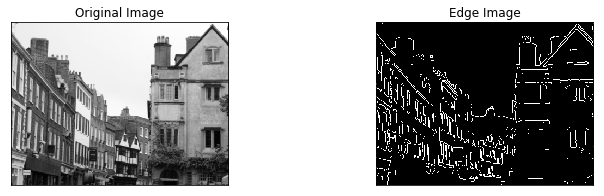

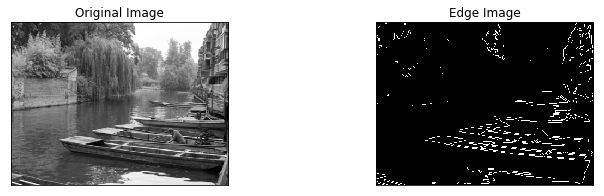

...

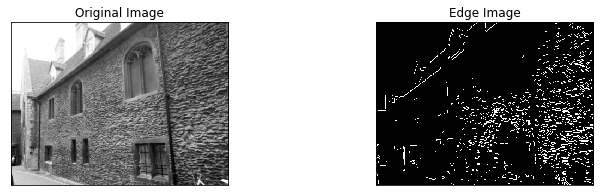

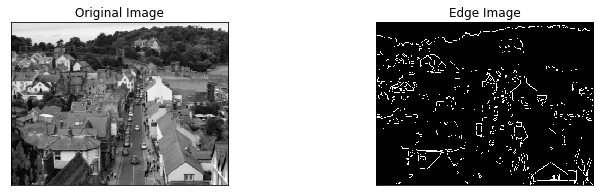

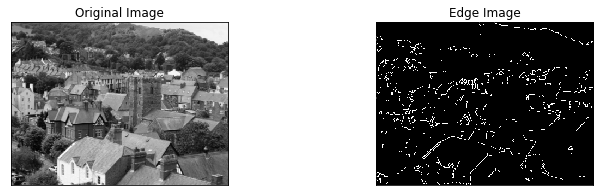

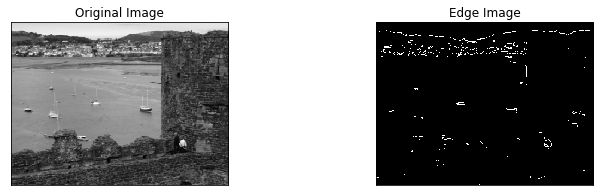

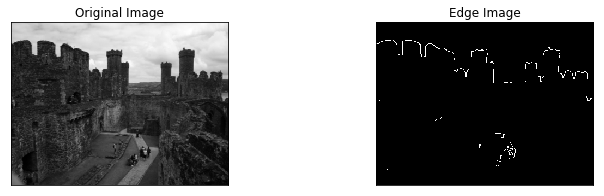

In [15]:
out_count = 0
for i, img in enumerate(imgs):
    if labels[i] == False and out_count < 15:
        out_count += 1
        edges = cv2.Canny(img, 300,400)
        fig = plt.figure(figsize=(12, 3))

        plt.subplot(121),plt.imshow(img,cmap = 'gray')
        plt.title('Original Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(122),plt.imshow(edges,cmap = 'gray')
        plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

Some of these images also only have edges in the top half. Thus, used Canny edge detection alone may be faulty

1. Apply Wavelet transform on all images
2. Store horizontal (note, these transformations take a long time

In [7]:
wavelet_imgs = []
for i, img in enumerate(imgs):
    if i % 50 == 0:
        print(i)
    coeffs2 = pywt.dwt2(img, 'bior1.3')
    wavelet_imgs.append(coeffs2[1][:2])

0
50
100
150
200
250
300
350


In [17]:
# Stack horiz and vert detail into 3d matrix
for i,stack in enumerate(wavelet_imgs):
    stack = np.dstack(stack)
    wavelet_imgs[i] = stack

### Reduce Dimensionality to see how well separated they are with the transform and without the transform

In [38]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

reduce_imgs = np.stack(imgs, axis=0)
reduce_wavelet_imgs = np.stack(wavelet_imgs, axis=0)

In [43]:
reduce_imgs.shape

(369, 300, 400)

In [44]:
reduce_wavelet_imgs.shape

(369, 152, 202, 2)

In [52]:
img_pca = PCA(n_components=2)
wavelet_img_pca = PCA(n_components=2)

pca_reduced_imgs = img_pca.fit_transform(reduce_imgs.reshape(-1,300*400))
pca_reduced_wavelet_imgs = img_pca.fit_transform(reduce_wavelet_imgs[:,:,:,0].reshape(-1,152*202))

Text(0.5,1,'PCA applied to grayscale images')

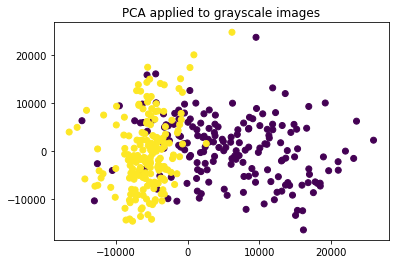

In [50]:
plt.scatter(pca_reduced_imgs[:,0],pca_reduced_imgs[:,1], c=labels)
plt.title("PCA applied to grayscale images")

Text(0.5,1,'PCA applied to horizontal wavelet images')

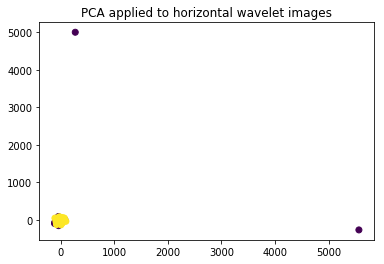

In [59]:
plt.scatter(pca_reduced_wavelet_imgs[:,0],pca_reduced_wavelet_imgs[:,1], c=labels)
plt.title("PCA applied to horizontal wavelet images")

This has almost no separability which is odd because Hunter's images do appear to be visually distinct from Alex's. Normalizing may solve this problem?

In [61]:
img_tsne = TSNE(n_components=2)
wavelet_img_tsne = TSNE(n_components=2, perplexity=50)

tsne_reduced_imgs = img_tsne.fit_transform(reduce_imgs.reshape(-1,300*400))
tsne_reduced_wavelet_imgs = wavelet_img_tsne.fit_transform(reduce_wavelet_imgs[:,:,:,0].reshape(-1,152*202))

Text(0.5,1,'TSNE applied to grayscale images')

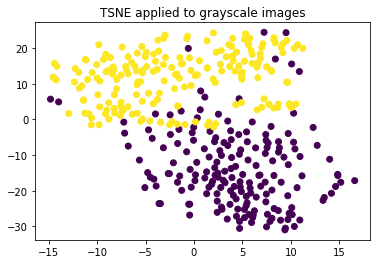

In [56]:
plt.scatter(tsne_reduced_imgs[:,0],tsne_reduced_imgs[:,1], c=labels)
plt.title("TSNE applied to grayscale images")

Text(0.5,1,'TSNE applied to horizontal wavelet images')

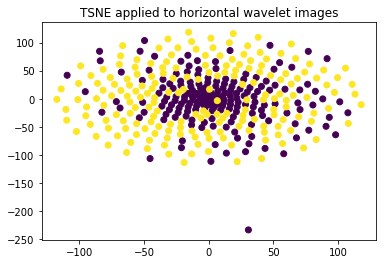

In [65]:
plt.scatter(tsne_reduced_wavelet_imgs[:,0],tsne_reduced_wavelet_imgs[:,1], c=labels,
           label=['Hunter' if x else 'Alex' for x in labels])
plt.title("TSNE applied to horizontal wavelet images")


##### Get train and test split for gray scale imgs and wavelet imgs

In [79]:
seed = 7
np.random.seed(seed)

x_train, x_test, y_train, y_test = train_test_split(wavelet_imgs, labels, test_size = 0.5)
x_train = np.stack(x_train, axis=0)
y_train = np.stack(y_train, axis=0)
x_test = np.stack(x_test, axis=0)
y_test = np.stack(y_test, axis=0)

gray_scale_x_train, gray_scale_x_test, gray_scale_y_train, gray_scale_y_test = train_test_split(imgs, labels, test_size = 0.5)
gray_scale_x_train = np.stack(gray_scale_x_train, axis=0)
gray_scale_y_train = np.stack(gray_scale_y_train, axis=0)
gray_scale_x_test = np.stack(gray_scale_x_test, axis=0)
gray_scale_y_test = np.stack(gray_scale_y_test, axis=0)

num_classes = 2

y_train = np_utils.to_categorical(y_train, num_classes)
y_test = np_utils.to_categorical(y_test, num_classes)

gray_scale_y_train = np_utils.to_categorical(gray_scale_y_train, num_classes)
gray_scale_y_test = np_utils.to_categorical(gray_scale_y_test, num_classes)

In [80]:
gray_scale_x_train = np.expand_dims(gray_scale_x_train, axis=3)
gray_scale_x_test = np.expand_dims(gray_scale_x_test, axis=3)
# y_train = np.expand_dims(y_train, axis=2)
# y_test = np.expand_dims(y_test, axis=2)

#data augmentation
datagen = ImageDataGenerator(
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=True,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=True,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    rotation_range=0,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=.2,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=.2,  # randomly shift images vertically (fraction of total height)
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False)  # randomly flip images

datagen.fit(gray_scale_x_train)

### Create a baseline model with NO transfer learning and NO wavelet transform

In [81]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
                 input_shape=(gray_scale_x_train.shape[1],gray_scale_x_train.shape[2],gray_scale_x_train.shape[3])))
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
                 input_shape=(x_train.shape[1],x_train.shape[2],1)))
model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
                 input_shape=(x_train.shape[1],x_train.shape[2],1)))
model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

# model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
#                  input_shape=(x_train.shape[1],x_train.shape[2],1)))
# model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# model.add(MaxPooling2D((2, 2)))
# model.add(BatchNormalization())


model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(num_classes, activation='softmax'))

opt = SGD(lr=.0001, momentum=.9)

model.compile(loss='categorical_crossentropy', optimizer=opt,
              metrics=['accuracy'])

In [82]:
EPOCHS = 10
BATCH = 8

callbacks = []
callbacks.append(ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                                   patience=10, verbose=1, mode='auto', min_delta=0.0001, cooldown=0, min_lr=0))

hist = model.fit_generator(datagen.flow(gray_scale_x_train, gray_scale_y_train,
                                 batch_size=BATCH),
                    steps_per_epoch = gray_scale_x_train.shape[0] // BATCH,
                    epochs=EPOCHS,
                    validation_data=(gray_scale_x_test, gray_scale_y_test),verbose=1,
                    callbacks = callbacks)

Epoch 1/10
15/23 [==================>...........] - ETA: 1:04 - loss: 0.6306 - acc: 0.7167

KeyboardInterrupt: 

### Create a baseline model with the wavelet transform but NO transfer learning

In [ ]:
#data augmentation
datagen = ImageDataGenerator(
    featurewise_center=False,  # set input mean to 0 over the dataset
    samplewise_center=True,  # set each sample mean to 0
    featurewise_std_normalization=False,  # divide inputs by std of the dataset
    samplewise_std_normalization=True,  # divide each input by its std
    zca_whitening=False,  # apply ZCA whitening
    rotation_range=0,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range=.2,  # randomly shift images horizontally (fraction of total width)
    height_shift_range=.2,  # randomly shift images vertically (fraction of total height)
    horizontal_flip=True,  # randomly flip images
    vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [35]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
                 input_shape=(x_train.shape[1],x_train.shape[2],x_train.shape[3])))
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
                 input_shape=(x_train.shape[1],x_train.shape[2],1)))
model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
                 input_shape=(x_train.shape[1],x_train.shape[2],1)))
model.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(BatchNormalization())

# model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same',
#                  input_shape=(x_train.shape[1],x_train.shape[2],1)))
# model.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# model.add(MaxPooling2D((2, 2)))
# model.add(BatchNormalization())


model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(num_classes, activation='softmax'))

opt = SGD(lr=.0001, momentum=.9)

model.compile(loss='categorical_crossentropy', optimizer=opt,
              metrics=['accuracy'])

In [36]:
EPOCHS = 10
BATCH = 8

callbacks = []
callbacks.append(ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                                   patience=10, verbose=1, mode='auto', min_delta=0.0001, cooldown=0, min_lr=0))

hist = model.fit_generator(datagen.flow(x_train, y_train,
                                 batch_size=BATCH),
                    steps_per_epoch = x_train.shape[0] // BATCH,
                    epochs=EPOCHS,
                    validation_data=(x_test, y_test),verbose=1,
                    callbacks = callbacks)

C:\Users\gjber\AppData\Roaming\Python\Python36\site-packages\keras_preprocessing\image.py:1643: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (184, 152, 202, 2) (2 channels).
  str(self.x.shape[channels_axis]) + ' channels).')


Epoch 1/10


KeyboardInterrupt: 

Results
 - With five epochs and half the data set for training, around 70-90% accuracy was achieved

In [37]:
from sklearn.metrics import precision_recall_fscore_support, classification_report, confusion_matrix

model_pred = model.predict(x_test)

# y[0] < 1 implies the output array is [0,1] which corresponds to 
y_test = [y[0] < 1 for y in y_test]
model_pred = [y[0] < 1 for y in model_pred]

confusion_matrix(y_test, model_pred)

array([[14, 73],
       [ 0, 98]], dtype=int64)

It appears that the network heavily over classifies one side over another

### Utilize transfer learning

In [ ]:
filepath = "caltech_101.h5"
model = load_model(filepath)

# Allow no weight adjustments for the pretrained layers
for layer in model.layers:
    layer.trainable = False
    

model.add(Dense(num_classes), activation='softmax')